# Tutorial: MaxRank Normalization of Rank Abundance Distributions (RADs)

## Preliminaries and installation

This tutorial for the julia package RankAbundanceDistributions.jl accompanies a manuscript (Saeedghalati *et al.* 2017 "Quantitative comparison of abundance structures of generalized communities: from B-cell receptor repertoires to microbiomes", http://dx.doi.org/10.1371/journal.pcbi.1005362) that explains a so-called RAD normalization method (see below) and presents several applications of the method to human B cells, gut microbiomes and environmental microbiomes.

In this tutorial, we work specifically with gut microbiome data from human individuals treated with the antibiotic Ciprofloxacin, published by Dethlefsen *et al.* 2008 (http://journals.plos.org/plosbiology/article?id=10.1371/journal.pbio.0060280). We use Rank Abundance Distributions (RADs) to monitor how the gut microbiome changes from before the treatment, to the treatment itself, and finally some time after the treatment.

If you are just interested in reading what RADs are and how they are used, you can skip the rest of this section and continue with section "Introducing RADs" below.

To run this tutorial you should have **Julia 1.0** installed on your computer (http://www.julialang.org), including the free OpenSource packages:

- DataFrames
- CSV
- StatPlots
- Distributed
- Distances
- IJulia
- RankAbundanceDistributions

The first packages are registered Julia packages and can simply be added in the Julia package manager. To add the last one, RankAbundanceDistributions, you call in the Julia package manager (start with "]" in julia REPL):
add https://github.com/DanielHoffmann32/RankAbundanceDistributions.jl

Depending on the state of the package ports to Julia 1.0 you may have to do one extra installation:
add https://github.com/JuliaStats/MultivariateStats.jl.git#master

This tutorial is the html-export of a Jupyter notebook (http://www.jupyter.org). You can find the notebook as file tutorial.ipynb in the "test" directory of the package RankAbundanceDistributions.

Once you have installed everything, we can start. As a first step we prepare the computer for a parallel computation to speed up things later on. This is not strictly necessary, but useful if you have many RADs to normalize. What that means becomes hopefully clear later:

In [1]:
#later on we will use two parallel processes to speed up computations:
using Distributed
procIDs = addprocs(2)

2-element Array{Int64,1}:
 2
 3

Moreover, we rely on the above packages and have to activate them for this session:

In [2]:
using DataFrames, RankAbundanceDistributions, StatPlots, Distances, CSV

┌ Info: Precompiling RankAbundanceDistributions [8edc0384-fcf0-5d96-ba7d-8d96f5edb286]
└ @ Base loading.jl:1186
┌ Warning: Package RankAbundanceDistributions does not have Clustering in its dependencies:
│ - If you have RankAbundanceDistributions checked out for development and have
│   added Clustering as a dependency but haven't updated your primary
│   environment's manifest file, try `Pkg.resolve()`.
│ - Otherwise you may need to report an issue with RankAbundanceDistributions
└ Loading Clustering into RankAbundanceDistributions from project dependency, future warnings for RankAbundanceDistributions are suppressed.
┌ Warning: Package RankAbundanceDistributions does not have Clustering in its dependencies:
│ - If you have RankAbundanceDistributions checked out for development and have
│   added Clustering as a dependency but haven't updated your primary
│   environment's manifest file, try `Pkg.resolve()`.
│ - Otherwise you may need to report an issue with RankAbundanceDistributions

LoadError: UndefVarError: SubDataFrame not defined

## Introducing RADs

Rank Abundance Distributions (RADs) are a way to capture the distribution of biological species in communities, where we use the term "species" for all types of distinct biological entities, e.g. microbial species in a microbiome, viral strains in a quasi-species, the diverse variants B cells in a person, etc. A RAD can be thought of as a plot with the two axes *rank* (x-axis) and *abundance* (y-axis). For the most abundant species we draw a point at the (x,y) coordinates $(1,a_1)$, with $a_1$ the abundance of this most abundant species. For the second most abundant species we draw a point at $(2, a_2)$. Below we show such a (theoretical) RAD, first as table, then as plot.

This is the theoretical example RAD as table:

In [4]:
RAD = DataFrame(rank = 1:100, abundance = round.(Int, 1.9./(1:100) * 100))

,rank,abundance
1,1,190
2,2,95
3,3,63
4,4,48
5,5,38
6,6,32
7,7,27
8,8,24
9,9,21
10,10,19


And there we have the same RAD as plot:

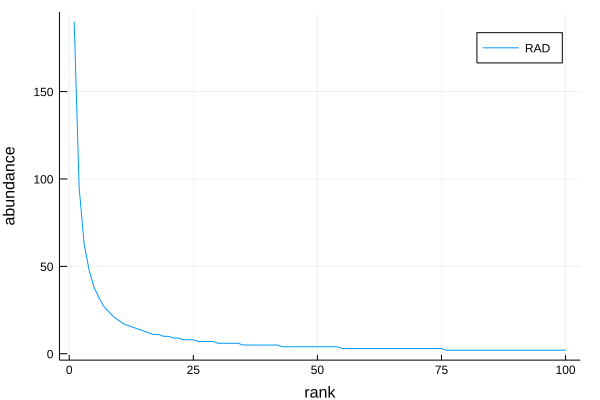

In [5]:
@df RAD plot(:rank, :abundance, lab="RAD")
xlabel!("rank")
ylabel!("abundance")

As is typical for a biological community, the RAD curve has a hollow shape. This means that the community has a small number of very abundant species, and a large number of rare species. The RADs may differ between communities, and that makes it interesting to compare them in order to learn about the communities.

Since *all* RADs have such a hollow shape with a very long tail to the right, it is often more instructive to plot RADs in a **log-log plot** to see better major differences between RADs. This is the plot type we will be using in the following: 

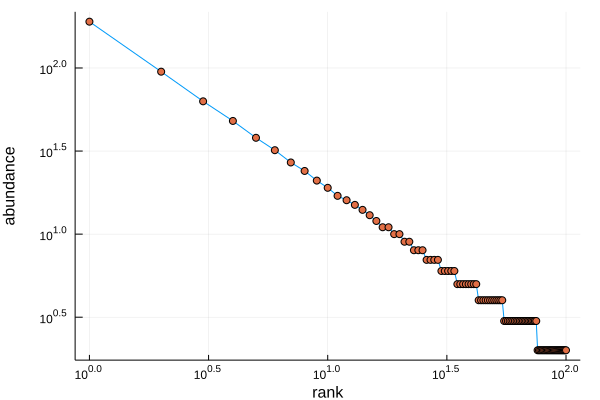

In [6]:
@df RAD plot(:rank, :abundance, lab="")
@df RAD scatter!(:rank, :abundance, lab="")
xaxis!("rank", :log10)
yaxis!("abundance", :log10)

Strictly speaking the RAD is not the continuous blue curve in the above plots but the discrete set of ranks and abundances indicated in the log-log-plot above.

## RAD example: gut microbiome under treatment with antibiotic (Dethlefsen *et al.* 2008)

Dethlefsen et al. 2008 (http://journals.plos.org/plosbiology/article?id=10.1371/journal.pbio.0060280) have treated healthy individuals with the antibiotic Ciprofloxacin and monitored the states of the gut microbiome before the treatment, during the treatment, and some time after the treatment. We will do the same with their data, but analyse it with RADs.

### Reading the data

First we have to read the data. It is contained in the package as OTU table:

In [7]:
otu_table = CSV.read(
    joinpath(splitdir(splitdir(pathof(RankAbundanceDistributions))[1])[1],"test/Dethlefsen2008.csv")
    )

,A1,A2a,A2b,A2c,A3a,A3b,A4,A5,B1,B2,B3,B4,B5,C1,C2,C3,C4,C5
1,0,0,3,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,2,2,0,0,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,2,2,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1,0,0,0
7,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0


The OTU table (OTU = operational taxonomic unit) contains abundances of all OTUs in all samples. Columns are samples, rows are OTUs. E.g. in sample A1, there was no observation of OTU 1 (abundance entry = 0), 56 observations of OTU 22, etc. "Observations" are here High-Throughput Sequencing (HTSeq) reads of 16S ribosomal genes. The sample names encode from which person the sample came (persons A, B, or C), and at which stage they were taken (1, 2: before treatment; 3: during treatment; 4, 5: after treatment). Thus, A1 is a sample of person A taken before the treatment.

### Turning the OTU table to a set of RADs

We now transform the OTU table into a set of RADs:

In [8]:
RADs = RAD_set_from_OTU_table(otu_table)

,rank,abundance,sample
1,1,2772,A1
2,2,2430,A1
3,3,2087,A1
4,4,2047,A1
5,5,1597,A1
6,6,1406,A1
7,7,1331,A1
8,8,1159,A1
9,9,1074,A1
10,10,1026,A1


The key commands of the package RankAbundanceDistributions have a short help page that you get with 

?command

E.g.:

In [9]:
?RAD_set_from_OTU_table

search: RAD_set_from_OTU_table



Transforms wide-format OTU tables into long-format RADs.

Input:

```
- OTU table as wide data frame, one column per sample (column names = sample names).

- optionally: skip (default: skip = 0); sometimes the first columns contains OTU names etc. If you want to skip this column (or any number of columns), give skip the corresponding value, e.g. set it to 1 to skip the first column.
```

Output:

```
- RADs as long data frame with three columns: rank, abundance (not normalized), sample.
```


Before starting an analysis it is often useful to look at a data summary:

In [10]:
RAD_set_summary(RADs)

,quantity,value
1,number of RADs,18
2,richness minimum,492
3,richness median,984.5
4,richness maximum,1465
5,abundance sum minimum,43049
6,abundance sum median,43423.5
7,abundance sum maximum,43602
8,abundance minima minium,1
9,abundance minima median,2.0
10,abundance minima maximum,2


As you can see, we have 18 RADs in this set, with richness (= number of OTUs) ranging from 492 to 1465. These large differences in richness make it difficult to compare the RADs of different samples directly. In the following plot you see the different richness values as maximum ranks (right endpoints) of the different RAD curves:

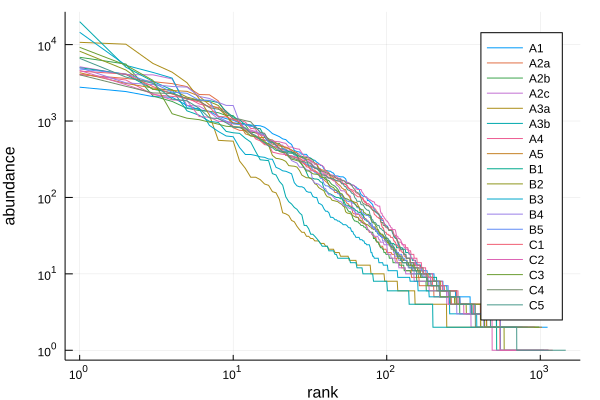

In [11]:
RAD_set_plot(RADs)

### MaxRank normalization of the RADs

MaxRank normalization generates from a RAD with given richness $S$ a "normalized RAD" (NRAD) with a user-chosen *smaller* richness (MaxRank) $R$. This is done by randomly re-sampling the original input of the RAD as long as the richness does not exceed $R$. Since this is a random procedure, we repeat it $n$ times and average.

MaxRank normalization allows us to turn several samples with *different* richness into a set of samples with the *same* richness. Mathematically, we turn vectors of different dimensions into vectors of the same dimension. It is easy to compare such vectors of the same dimension quantitatively.

Let us generate first for our RADs the corresponding NRADs. If we do not explicitly state $R$, the normalization procedure will first look up the minimum richness RAD in the whole RAD set (here: 492), and then normalize all RADs in the set to this $R$. Since this takes a minute or so, we use the parallelization over different processes (see procIDs above) to get the result faster:

In [12]:
NRADs = RAD_set_normalize(RADs, n=100, procIDs=procIDs, verbose=true, conf_level=0.9)

Will now MaxRank normalize 18 RADs:
process with ID 3 finished
sorting NRADs by sample

MaxRank normalization of 18 RADs done.



,sample,rank,abundance,lower_ci,upper_ci
1,A1,1,0.0637496,0.063386,0.0641414
2,A1,2,0.0558247,0.0553826,0.0562156
3,A1,3,0.0492428,0.048985,0.0496129
4,A1,4,0.0461552,0.045766,0.0464713
5,A1,5,0.0364519,0.0360607,0.0367576
6,A1,6,0.0326765,0.0323977,0.0329224
7,A1,7,0.0302106,0.0300153,0.0304711
8,A1,8,0.0270184,0.0267542,0.0272827
9,A1,9,0.0251543,0.0249528,0.0253386
10,A1,10,0.0236691,0.023517,0.0238086


Now we are done. All 18 RADs have been normalized to 18 NRADs with $R=492$. 

There are several changes in comparison to the original RADs:

- The abundances in each NRAD are normalized to a total abundance of 1, i.e. the values in column "abundance" are now rank *probabilities* summing up to 1.
- There are two new columns *lower_ci* and *upper_ci* that give a lower and upper boundary of a 90% confidence interval for the abundance value. The confidence interval is computed by bootstrapping the 90% confidence interval of the mean abundance for each rank (this was the parameter value conf_level=0.9 in the call to RAD_set_normalize).
- Of course all NRADs have now the same maximum richness of $R=492$.

We can check normalization and richness properties by looking a the summary of the NRAD set:

In [13]:
RAD_set_summary(NRADs)

,quantity,value
1,number of RADs,18
2,richness minimum,492
3,richness median,492.0
4,richness maximum,492
5,abundance sum minimum,1.0
6,abundance sum median,1.0
7,abundance sum maximum,1.0
8,abundance minima minium,3.13136e-5
9,abundance minima median,0.000116941
10,abundance minima maximum,0.000165283


In [14]:
NRADs

,sample,rank,abundance,lower_ci,upper_ci
1,A1,1,0.0637496,0.063386,0.0641414
2,A1,2,0.0558247,0.0553826,0.0562156
3,A1,3,0.0492428,0.048985,0.0496129
4,A1,4,0.0461552,0.045766,0.0464713
5,A1,5,0.0364519,0.0360607,0.0367576
6,A1,6,0.0326765,0.0323977,0.0329224
7,A1,7,0.0302106,0.0300153,0.0304711
8,A1,8,0.0270184,0.0267542,0.0272827
9,A1,9,0.0251543,0.0249528,0.0253386
10,A1,10,0.0236691,0.023517,0.0238086


The plot of the NRADs shows that they all have the same maximum richness (tail of RADs end all at same rank 492). Note that also the abundance axis now has a different scale:

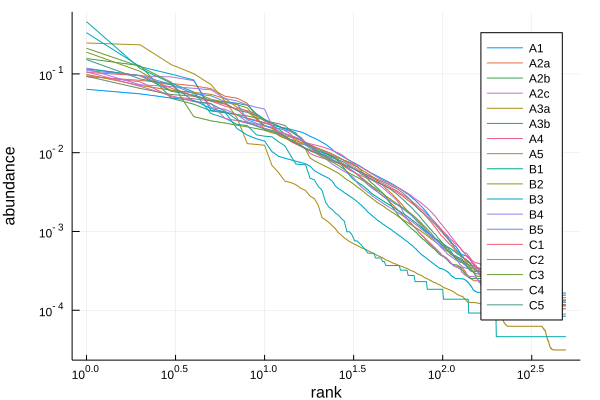

In [15]:
RAD_set_plot(NRADs, true)

The NRAD shapes look similar to the RAD shapes. However, since there are 18 curves on top of each other, it is not easy to see systematic patterns. We will therefore use first an ordination method that makes the comparison between NRADs easier.

### Multi-dimensional scaling and NRAD entropies 

The first NRAD analysis that we do here is multi-dimensional scaling or MDS (https://en.wikipedia.org/wiki/Multidimensional_scaling). For MDS we do the following:

1. compute all distances (here: Cityblock or Manhattan distances) between the NRADs, which is now simple since all live in the same dimension
2. look for a 18-dimensional distribution of 18-dimensional points that explains all these distances
3. find a lower-dimensional projection (usually 2-dimensional projection) that explains most of the distance variance

First we produce the distance matrix $d$, then we apply classical MDS (cMDS) to obtain a 2D-projection:

In [16]:
d = RAD_set_to_distmat(NRADs,Cityblock())
cmds, eigen = RAD_set_cMDS(NRADs, d)

(18×3 DataFrame
│ Row │ sample │ x1         │ x2          │
├─────┼────────┼────────────┼─────────────┤
│ 1   │ A1     │ -0.365838  │ -0.0963825  │
│ 2   │ A2a    │ -0.0987368 │ 0.138191    │
│ 3   │ A2b    │ -0.0289058 │ -0.0646917  │
│ 4   │ A2c    │ -0.0307716 │ 0.0356468   │
│ 5   │ A3a    │ 0.661596   │ 0.267178    │
│ 6   │ A3b    │ 0.596623   │ -0.24646    │
│ 7   │ A4     │ -0.231765  │ -0.00764036 │
│ 8   │ A5     │ -0.181204  │ 0.0568611   │
│ 9   │ B1     │ -0.109878  │ 0.0469475   │
│ 10  │ B2     │ 0.0843215  │ 0.0332537   │
│ 11  │ B3     │ 0.479811   │ -0.0796818  │
│ 12  │ B4     │ -0.0889978 │ 0.133821    │
│ 13  │ B5     │ -0.0884612 │ 0.0464717   │
│ 14  │ C1     │ -0.138353  │ -0.00583638 │
│ 15  │ C2     │ -0.246359  │ -0.090062   │
│ 16  │ C3     │ 0.0995335  │ -0.111317   │
│ 17  │ C4     │ -0.247495  │ 0.0139861   │
│ 18  │ C5     │ -0.0651188 │ -0.0702859  │, [0.750819, 0.867473, 0.915121, 0.942629, 0.960655, 0.973339, 0.983047, 0.989041, 0.994933, 0.998265, 0.

Check how much of the variance is explained with two dimensions:

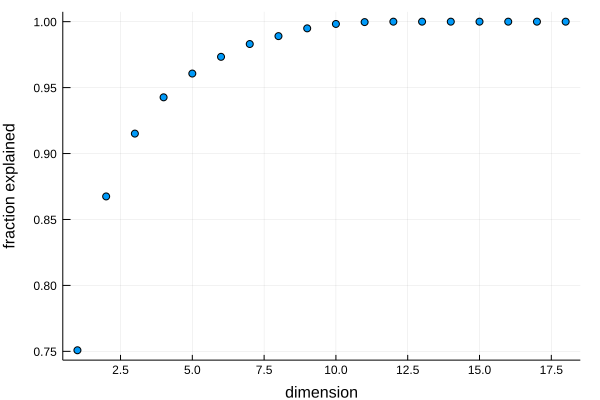

In [17]:
scatter(1:length(eigen),eigen, xaxis=("dimension"), yaxis=("fraction explained"), lab="")

About 86% of the distance variance is explained by the first two dimensions $x_1, x_2$. That is good enough for an overview. We therefore plot the MDS output in 2D:

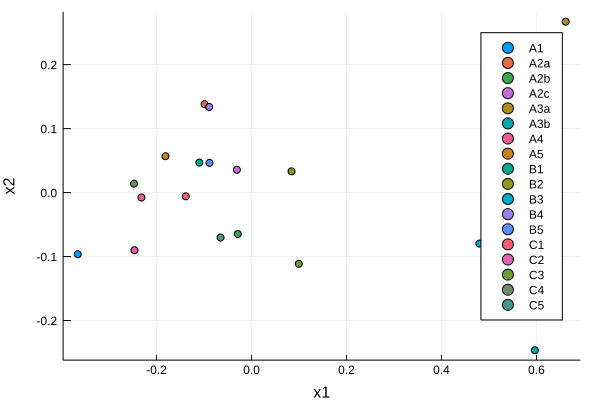

In [18]:
@df cmds scatter(:x1,:x2,group=:sample,xaxis=("x1"),yaxis=("x2"))

In this MDS plot, each NRAD corresponds to a single point. If you remember the naming convention, you see an interesting pattern: All samples with a "3" (= during treatment) are lying right of all other samples. Moreover, the samples with 1 and 2 (= before treatment) mix with the samples with 4 and 5 (= after treatment). That means that the NRADs start in the left cluster, then move right, and then return to the left cluster. This is what Dethlefsen *et al.* also find with different techniques.

To make this insight a bit more visually accessible, we color the points according to treatment stage (before, during, after):

In [19]:
#we generate a list of group labels for the different sample groups
samples = unique(NRADs[:sample])

18-element Array{String,1}:
 "A1" 
 "A2a"
 "A2b"
 "A2c"
 "A3a"
 "A3b"
 "A4" 
 "A5" 
 "B1" 
 "B2" 
 "B3" 
 "B4" 
 "B5" 
 "C1" 
 "C2" 
 "C3" 
 "C4" 
 "C5" 

In [20]:
#samples with numbers 1 and 2 are *before* treatment:
samples = map(x -> replace(x, Regex("^[A-C][1-2].*")=>"before"), samples)

#samples with numbers 1 and 2 are *during* treatment:
samples = map(x -> replace(x, Regex("^[A-C][3].*")=>"during"), samples)

#samples with numbers 1 and 2 are *after* treatment:
samples = map(x -> replace(x, Regex("^[A-C][4-5].*")=>"after"), samples)

18-element Array{String,1}:
 "before"
 "before"
 "before"
 "before"
 "during"
 "during"
 "after" 
 "after" 
 "before"
 "before"
 "during"
 "after" 
 "after" 
 "before"
 "before"
 "during"
 "after" 
 "after" 

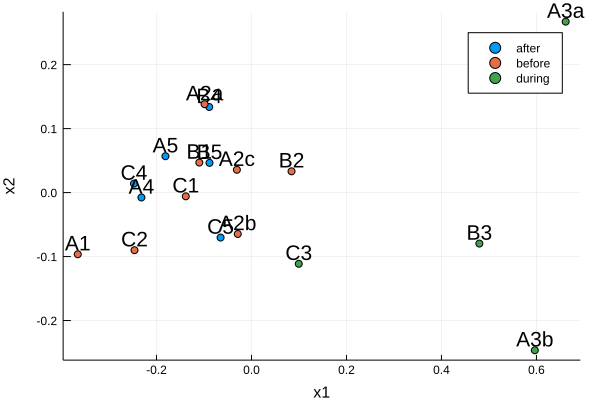

In [21]:
cmds[:state] = samples
@df cmds scatter(:x1,:x2,group=:state,xaxis=("x1"),yaxis=("x2"),series_annotation="\n".*:sample)

Now we see more clearly what we have described above: we have one compact cluster before and after treatment (red and blue points), and a strong change to a diffuse cluster (green points, sample names with "3") during treatment.

The first dimension ($x_1$) is usually closely related to the entropy $H = -\sum_{i=1}^R p_i \log p_i$ of the sample, a measure of the diversity of the sample. Here it looks as if the first dimension alone can separate the "during" group from the "before" and "after" groups. Hence, let us look at the entropies: 

In [22]:
H = RAD_set_entropies(NRADs)

,sample,entropy
1,A1,4.49786
2,A2a,3.95383
3,A2b,3.90228
4,A2c,3.91617
5,A3a,2.53307
6,A3b,2.41185
7,A4,4.30754
8,A5,4.17693
9,B1,4.01618
10,B2,3.74538


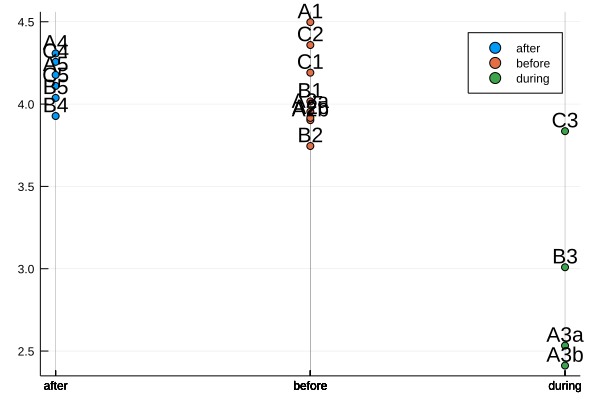

In [23]:
H[:state] = samples;
@df H scatter(:state, :entropy, group=:state, series_annotation="\n".*:sample)

In fact, we can almost completely separate the states before and after from during treatment with entropy. The C3 sample is an outlier, but still does not change the story. 

This result makes sense as we have to expect that the diversity of the gut microbiome *during* treatment decreases a lot because many microbial species will be lost in that stage.

### Averaging NRADs

Sometimes it is helpful to summarize the NRADs in a cluster of NRADs in an averaged NRAD. Here we will average the NRADs in the three groups "before", "during", "after". 

To do this we first select the respective NRADs for each of the three groups, then compute the three averages, and finally concatenate all three average NRADs to a single NRAD set of three averaged NRADs and plot the set:

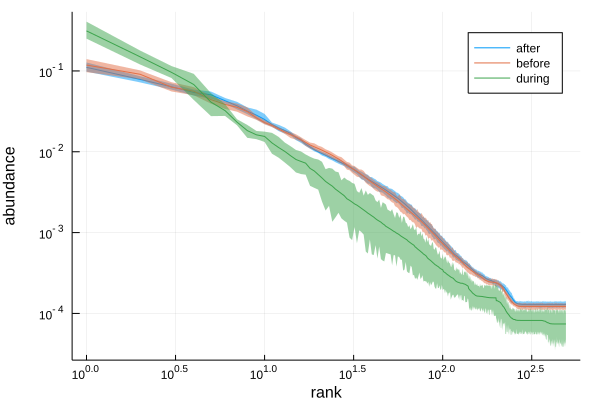

In [24]:
NRADs_before = RAD_samples_regex_set(NRADs, ["1","2"])
mean_before = RAD_set_mean(NRADs_before, name="before")

NRADs_during = RAD_samples_regex_set(NRADs, ["3"]);
mean_during = RAD_set_mean(NRADs_during, name="during")

NRADs_after = RAD_samples_regex_set(NRADs, ["4","5"]);
mean_after = RAD_set_mean(NRADs_after, name="after")

means = vcat(mean_before, mean_during, mean_after)
RAD_set_plot(means, true)

The three averaged NRADs are the bold lines, and the shaded areas are the 90% confidence intervals for the mean, estimated by bootstrapping. It is still the same story as above. We see that the averages *before* and *after* are very similar and relatively flat (higher evenness), while the average *during* is steeper, i.e. it is more dominated by those few microbiome components that cope best with the antibiotic treatment. You also see that the confidence intervals around *before* and *after* are narrow, while the confidence interval of the *during* cluster is much wider, corresponding to the fuzzy "during" cluster in the MDS analysis.

## More to explore

The julia package RankAbundanceDistributions contains a number of functions beyond those used above. The most useful are:

- RAD_set_from_OTU_table,
- RAD_leave_one_out_regression_forest,
- RAD_kmedoids,
- RAD_samples_subset,
- RAD_samples_regex_set,
- RAD_set_affinityprop,
- RAD_set_cMDS,
- RAD_set_entropies,
- RAD_set_evenness,
- RAD_set_minimum_richness,
- RAD_set_normalize,
- RAD_set_plot,
- RAD_set_representatives,
- RAD_set_richness,
- RAD_set_summary,
- RAD_set_to_distmat

Many more quantitative analyses are possible that exploit the vectorial nature of NRADs.